In [1]:
import numpy as np
import astropy.units as u
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.coordinates import SkyCoord
from astropy.io import fits
import matplotlib as mpl
import matplotlib.pyplot as plt
import h5py
import pandas as pd

from deproject import deproject, get_galaxy_specs

# Maps for NGC0628

Set OBSGEO-B to   -37.752345 from OBSGEO-[XYZ].
Set OBSGEO-H to 1738852822.655 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -37.752345 from OBSGEO-[XYZ].
Set OBSGEO-H to 1738852822.655 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


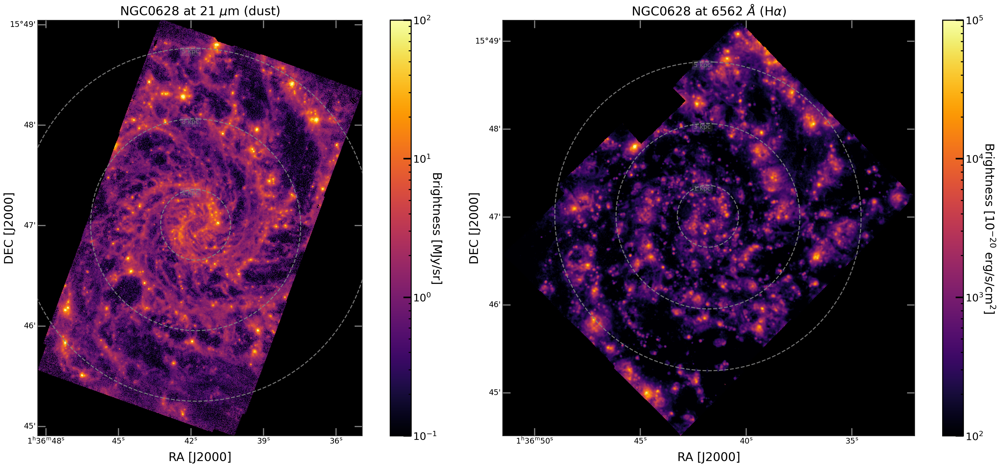

In [6]:
from skimage import measure

f = plt.figure(figsize=(30, 12))

f.set_dpi(150)
f.set_facecolor('none')

dust_hdu_galx = fits.open('ISM/JWST-MIRI-21micron-dust/ngc0628_miri_f2100w_anchored.fits')[-1]
wcs_im = WCS(dust_hdu_galx.header)
ax0 = f.add_subplot(121, projection=wcs_im)


cm = plt.cm.get_cmap('inferno')
plt.set_cmap(cm)


# dust
im = ax0.imshow(dust_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e2), aspect='equal')
mask = np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax0.set_xlim(min(xvals[0]), max(xvals[0]))
ax0.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC0628') # DIST [Mpc]
coords = SkyCoord.from_name('NGC0628')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=dust_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = dust_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax0.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax0.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax0)
cbar.set_label('Brightness [MJy/sr]', rotation=270, fontsize=23, labelpad=10)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax0.spines.values(), linewidth=3)
ax0.set_title('NGC0628 at 21 $\mu$m (dust)', fontsize=24, pad=10)


# Ha
Ha_hdu_galx = fits.open('ISM/VLT-MUSE-Halpha/NGC0628-0.92asec_MAPS.fits')['HA6562_FLUX']
wcs_im = WCS(Ha_hdu_galx.header)
ax1 = f.add_subplot(122, projection=wcs_im)

im = ax1.imshow(Ha_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e2, vmax=1e5), aspect='equal')
mask = np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax1.set_xlim(min(xvals[0]), max(xvals[0]))
ax1.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC0628') # DIST [Mpc]
coords = SkyCoord.from_name('NGC0628')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=Ha_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = Ha_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax1.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax1.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax1)
cbar.set_label('Brightness [$10^{-20}$ erg/s/cm$^2$]', rotation=270, fontsize=23, labelpad=25)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax1.spines.values(), linewidth=3)
ax1.set_title('NGC0628 at 6562 $\AA$ (H$\\alpha$)', fontsize=24, pad=10)

for ax in [ax0, ax1]:
    ax.set_facecolor("black")
    ax.tick_params(which='major', direction='in', color='grey', length=15, width=2, labelsize=15)
    ax.set_xlabel('RA [J2000]', fontsize=23)
    ax.set_ylabel('DEC [J2000]', fontsize=23, labelpad=0.02)
    
f.tight_layout()


# Maps for NGC7496

Set OBSGEO-B to   -38.353367 from OBSGEO-[XYZ].
Set OBSGEO-H to 1740828096.544 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.353367 from OBSGEO-[XYZ].
Set OBSGEO-H to 1740828096.544 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


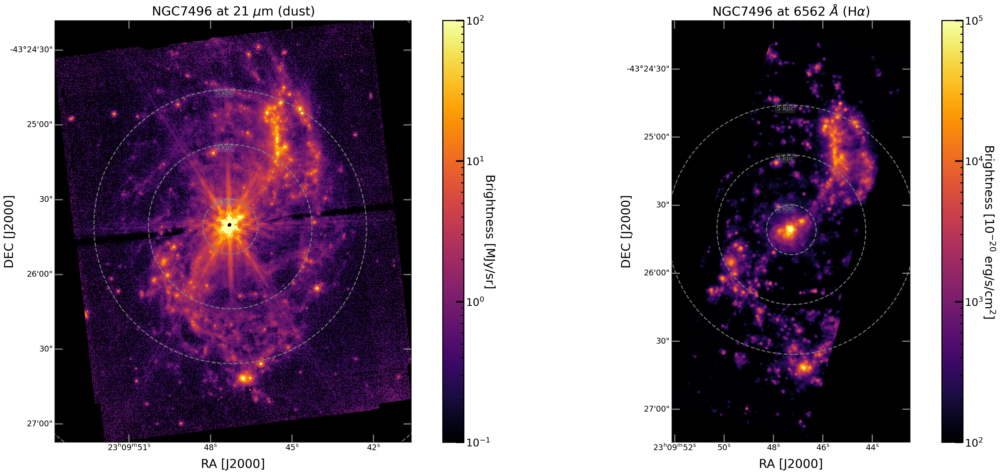

In [2]:
from skimage import measure

f = plt.figure(figsize=(30, 12))

f.set_dpi(150)
f.set_facecolor('none')

dust_hdu_galx = fits.open('ISM/JWST-MIRI-21micron-dust/ngc7496_miri_f2100w_anchored.fits')[-1]
wcs_im = WCS(dust_hdu_galx.header)
ax0 = f.add_subplot(121, projection=wcs_im)


cm = plt.cm.get_cmap('inferno')
plt.set_cmap(cm)


# dust
im = ax0.imshow(dust_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e2), aspect='equal')
mask = np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax0.set_xlim(min(xvals[0]), max(xvals[0]))
ax0.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC7496') # DIST [Mpc]
coords = SkyCoord.from_name('NGC7496')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=dust_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = dust_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax0.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax0.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax0)
cbar.set_label('Brightness [MJy/sr]', rotation=270, fontsize=23, labelpad=10)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax0.spines.values(), linewidth=3)
ax0.set_title('NGC7496 at 21 $\mu$m (dust)', fontsize=24, pad=10)


# Ha
Ha_hdu_galx = Ha_hdu_galx = fits.open('ISM/VLT-MUSE-Halpha/NGC7496-0.89asec_MAPS.fits')['HA6562_FLUX']
wcs_im = WCS(Ha_hdu_galx.header)
ax1 = f.add_subplot(122, projection=wcs_im)

im = ax1.imshow(Ha_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e2, vmax=1e5), aspect='equal')
mask = np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax1.set_xlim(min(xvals[0]), max(xvals[0]))
ax1.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC7496') # DIST [Mpc]
coords = SkyCoord.from_name('NGC7496')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=Ha_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = Ha_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax1.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax1.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax1)
cbar.set_label('Brightness [$10^{-20}$ erg/s/cm$^2$]', rotation=270, fontsize=23, labelpad=25)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax1.spines.values(), linewidth=3)
ax1.set_title('NGC7496 at 6562 $\AA$ (H$\\alpha$)', fontsize=24, pad=10)

for ax in [ax0, ax1]:
    ax.set_facecolor("black")
    ax.tick_params(which='major', direction='in', color='grey', length=15, width=2, labelsize=15)
    ax.set_xlabel('RA [J2000]', fontsize=23)
    ax.set_ylabel('DEC [J2000]', fontsize=23, labelpad=0.02)
    
f.tight_layout()


# Maps for NGC4321

Set OBSGEO-B to     8.121183 from OBSGEO-[XYZ].
Set OBSGEO-H to 1678395731.623 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.121183 from OBSGEO-[XYZ].
Set OBSGEO-H to 1678395731.623 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


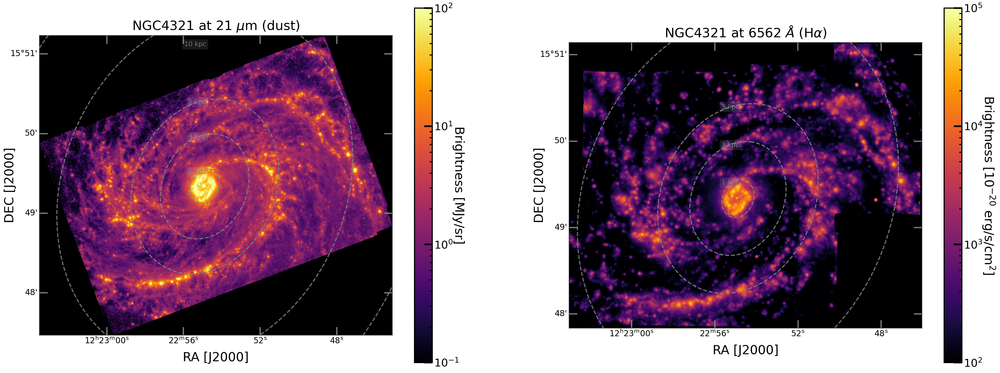

In [20]:
from skimage import measure

f = plt.figure(figsize=(32, 12))

f.set_dpi(150)
f.set_facecolor('none')

dust_hdu_galx = fits.open('ISM/JWST-MIRI-21micron-dust/ngc4321_miri_f2100w_anchored.fits')[-1]
wcs_im = WCS(dust_hdu_galx.header)
ax0 = f.add_subplot(121, projection=wcs_im)


cm = plt.cm.get_cmap('inferno')
plt.set_cmap(cm)


# dust
im = ax0.imshow(dust_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e2), aspect='equal')
mask = np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax0.set_xlim(min(xvals[0]), max(xvals[0]))
ax0.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC4321') # DIST [Mpc]
coords = SkyCoord.from_name('NGC4321')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=dust_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = dust_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 2, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax0.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(dust_hdu_galx.data) | np.isinf(dust_hdu_galx.data) | np.equal(dust_hdu_galx.data, 0) | (dust_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax0.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax0)
cbar.set_label('Brightness [MJy/sr]', rotation=270, fontsize=23, labelpad=10)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax0.spines.values(), linewidth=3)
ax0.set_title('NGC4321 at 21 $\mu$m (dust)', fontsize=24, pad=10)


# Ha
Ha_hdu_galx = Ha_hdu_galx = fits.open('ISM/VLT-MUSE-Halpha/NGC4321-1.16asec_MAPS.fits')['HA6562_FLUX']
wcs_im = WCS(Ha_hdu_galx.header)
ax1 = f.add_subplot(122, projection=wcs_im)

im = ax1.imshow(Ha_hdu_galx.data, origin='lower', norm=mpl.colors.LogNorm(vmin=1e2, vmax=1e5), aspect='equal')
mask = np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
xvals = np.where(~(mask).all(axis=0))
yvals = np.where(~(mask).all(axis=1))
ax1.set_xlim(min(xvals[0]), max(xvals[0]))
ax1.set_ylim(min(yvals[0]), max(yvals[0]))

RA, DEC, POSANG, INCL, DIST = get_galaxy_specs('NGC4321') # DIST [Mpc]
coords = SkyCoord.from_name('NGC4321')
deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                       header=Ha_hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                       return_offset=False)
r_deg = deproj_img[0]
r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
data = Ha_hdu_galx.data.flatten()
radii = r_pc.flatten()
#         data = hdu_galx.data
r_center_mask = (r_pc>0.1*1e3) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
r_center_xvals = np.where(~(r_center_mask).all(axis=0))
for R_cuts in np.array([1, 3, 5, 10, 15, 20])*1e3: # 1, 3, 5, ... kpc
    contours = measure.find_contours(r_pc, R_cuts)
    for contour in contours:
        ax1.plot(contour[:, 1], contour[:, 0], color='grey', linewidth=2, ls='--', alpha=0.9) 

    r_mask = (r_pc>R_cuts) | np.isnan(Ha_hdu_galx.data) | np.isinf(Ha_hdu_galx.data) | np.equal(Ha_hdu_galx.data, 0) | (Ha_hdu_galx.data<0)
    r_xvals = np.where(~(r_mask).all(axis=0))
    r_yvals = np.where(~(r_mask).all(axis=1))
    props = dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.1)
    if abs(min(r_center_xvals[0])-min(xvals[0]))<10 or abs(min(r_center_xvals[0])-max(xvals[0]))<10 or abs(max(r_yvals[0])-min(yvals[0]))<10 or abs(max(r_yvals[0])-max(yvals[0]))<10 :
        pass
    else:
        ax1.text(max(r_center_xvals[0]), max(r_yvals[0]), str(int(R_cuts/1e3))+' kpc', fontsize=12,
                 color='grey', verticalalignment='top', horizontalalignment='right', bbox=props, alpha=0.9)
cbar = f.colorbar(im, ax=ax1)
cbar.set_label('Brightness [$10^{-20}$ erg/s/cm$^2$]', rotation=270, fontsize=23, labelpad=25)
cbar.ax.tick_params(direction='in', which='both', labelsize=20)
cbar.ax.tick_params(which='major', length=15, width=3)
cbar.ax.tick_params(which='minor', length=5, width=2)
plt.setp(cbar.ax.spines.values(), linewidth=2)
plt.setp(ax1.spines.values(), linewidth=3)
ax1.set_title('NGC4321 at 6562 $\AA$ (H$\\alpha$)', fontsize=24, pad=10)

for ax in [ax0, ax1]:
    ax.set_facecolor("black")
    ax.tick_params(which='major', direction='in', color='grey', length=15, width=2, labelsize=15)
    ax.set_xlabel('RA [J2000]', fontsize=23)
    ax.set_ylabel('DEC [J2000]', fontsize=23, labelpad=0.02)
    
# f.tight_layout()


# Radial Profiles

In [30]:
def percentile16(x):
    return np.percentile(x, 16)

def percentile84(x):
    return np.percentile(x, 84)

def percentile50(x):
    return np.percentile(x, 50)

def make_radial_profile(target='NGC0628', path='ISM/JWST-MIRI-21micron-dust/ngc0628_miri_f2100w_anchored.fits', key=-1):
    
    from scipy import stats
    
    hdu_galx = fits.open(str(path))[key]
    data = hdu_galx.data.flatten()
    
    RA, DEC, POSANG, INCL, DIST = get_galaxy_specs(target)
    deproj_img = deproject(center_coord=(RA*u.deg, DEC*u.deg), incl=INCL*u.deg, pa=POSANG*u.deg,
                           header=hdu_galx.header, wcs=None, naxis=None, ra=None, dec=None,
                           return_offset=False)
    r_deg = deproj_img[0]
    r_pc = r_deg * (np.pi / 180) * (DIST * 1e6) # in pc
    r_kpc = r_pc / 1e3 # in kpc
    radii = r_kpc.flatten()
    
    cut = (~np.isnan(data))
    flux = data[cut] 
    rad = radii[cut]
    
    n_bins=800
    rad_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
    for i in range(1, (n_bins+1)):
        rad_percentiles[i] = np.percentile(rad, (100/n_bins)*i)
#     rad_bins = np.linspace(min(rad), max(rad), 300)
    I16, BE, BN = stats.binned_statistic(rad, flux, percentile16, bins=rad_percentiles)
    I50, BE, BN = stats.binned_statistic(rad, flux, percentile50, bins=rad_percentiles)
    I84, BE, BN = stats.binned_statistic(rad, flux, percentile84, bins=rad_percentiles)
    BC = np.array([(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]) 
    
    return BC, I16, I50, I84
    

Set OBSGEO-B to   -37.752345 from OBSGEO-[XYZ].
Set OBSGEO-H to 1738852822.655 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.353367 from OBSGEO-[XYZ].
Set OBSGEO-H to 1740828096.544 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.121183 from OBSGEO-[XYZ].
Set OBSGEO-H to 1678395731.623 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


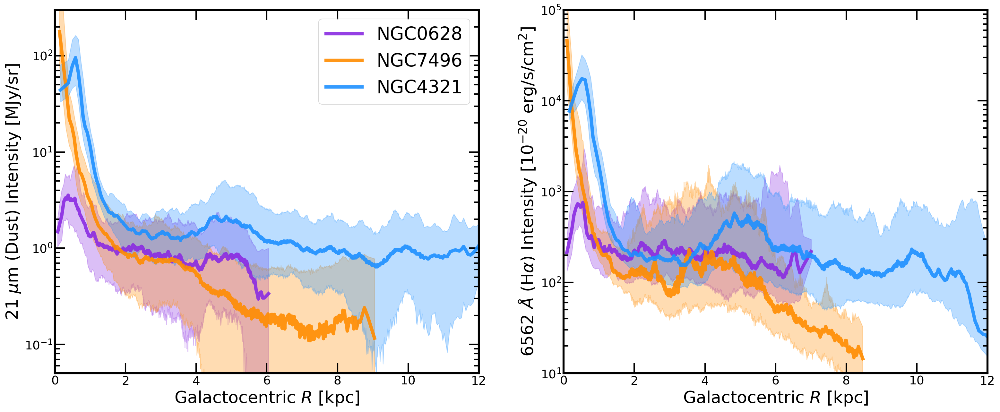

In [31]:
f, ax = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(25, 10)) 
f.set_dpi(150)
f.set_facecolor('none')

# Dust - JWST
# NGC0628
BC, I16, I50, I84 = make_radial_profile(target='NGC0628', path='ISM/JWST-MIRI-21micron-dust/ngc0628_miri_f2100w_anchored.fits', key=-1)
ax[0].plot(BC, I50, color = 'blueviolet', lw=5, alpha=0.9, label='NGC0628')
ax[0].fill_between(BC, I16, I84, facecolor='blueviolet', edgecolor='blueviolet', alpha=0.3)
# NGC7496
BC, I16, I50, I84 = make_radial_profile(target='NGC7496', path='ISM/JWST-MIRI-21micron-dust/ngc7496_miri_f2100w_anchored.fits', key=-1)
ax[0].plot(BC, I50, color = 'darkorange', lw=5, alpha=0.9, label='NGC7496')
ax[0].fill_between(BC, I16, I84, facecolor='darkorange', edgecolor='darkorange', alpha=0.3)
# NGC4321
BC, I16, I50, I84 = make_radial_profile(target='NGC4321', path='ISM/JWST-MIRI-21micron-dust/ngc4321_miri_f2100w_anchored.fits', key=-1)
ax[0].plot(BC, I50, color = 'dodgerblue', lw=5, alpha=0.9, label='NGC4321')
ax[0].fill_between(BC, I16, I84, facecolor='dodgerblue', edgecolor='dodgerblue', alpha=0.3)
ax[0].set_ylim(5e-2, 3e2)
ax[0].set_ylabel('21 $\mu$m (Dust) Intensity [MJy/sr]', fontsize=25)
ax[0].legend(loc='upper right', fontsize=27)

# Ha - MUSE
# NGC0628
BC, I16, I50, I84 = make_radial_profile(target='NGC0628', path='ISM/VLT-MUSE-Halpha/NGC0628-0.92asec_MAPS.fits', key='HA6562_FLUX')
ax[1].plot(BC, I50, color = 'blueviolet', lw=5, alpha=0.9)
ax[1].fill_between(BC, I16, I84, facecolor='blueviolet', edgecolor='blueviolet', alpha=0.3)
# ax[0].set_title('NGC0628', fontsize=27) 
# NGC7496
BC, I16, I50, I84 = make_radial_profile(target='NGC7496', path='ISM/VLT-MUSE-Halpha/NGC7496-0.89asec_MAPS.fits', key='HA6562_FLUX')
ax[1].plot(BC, I50, color = 'darkorange', lw=5, alpha=0.9)
ax[1].fill_between(BC, I16, I84, facecolor='darkorange', edgecolor='darkorange', alpha=0.3)
# ax[1].set_title('NGC7496', fontsize=27) 
# NGC4321
BC, I16, I50, I84 = make_radial_profile(target='NGC4321', path='ISM/VLT-MUSE-Halpha/NGC4321-1.16asec_MAPS.fits', key='HA6562_FLUX')
ax[1].plot(BC, I50, color = 'dodgerblue', lw=5, alpha=0.9)
ax[1].fill_between(BC, I16, I84, facecolor='dodgerblue', edgecolor='dodgerblue', alpha=0.3)
# ax[2].set_title('NGC4321', fontsize=27) 
ax[1].set_ylim(1e1, 1e5)
ax[1].set_ylabel('6562 $\AA$ (H$\\alpha$) Intensity [$10^{-20}$ erg/s/cm$^2$]', fontsize=25)


for axi in ax:        
    axi.tick_params(which='major', length=15)
    axi.tick_params(which='minor', length=7)
    axi.tick_params(direction='in', which='both', width=2, labelsize=18, 
                           bottom=True, top=True, left=True, right=True)
    plt.setp(axi.spines.values(), linewidth=3)
    axi.set_yscale('log')
    axi.set_xlim(0, 12)
    axi.set_xlabel('Galactocentric $R$ [kpc]', fontsize=25)

# f.tight_layout()

# Sersic Profile

In [11]:
from scipy.optimize import curve_fit

def sersic(r, Ie, n, re):
    bn = 1.9992*n - 0.3271 # okay for 0.5 < n < 10
#     return mue + 1.086*bn*( (r/re)**(1/n) - 1 )
    I = Ie*np.exp(-bn * ((r/re)**(1/n) - 1))
    return I

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]


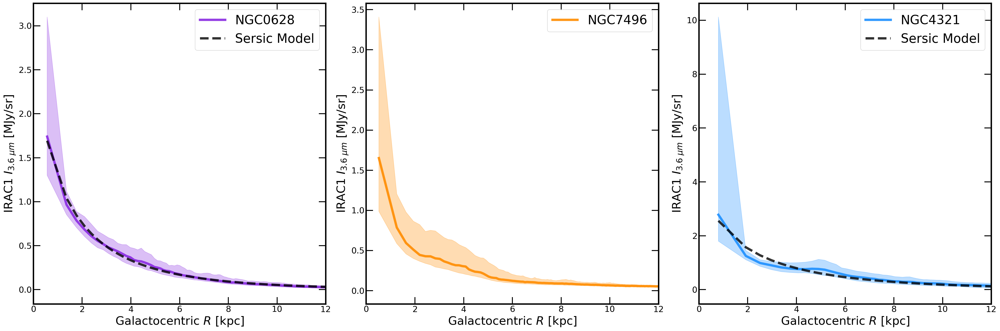

In [29]:
f, ax = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(30, 10)) 
f.set_dpi(150)
f.set_facecolor('none')

# NGC0628
BC, I16, I50, I84 = make_radial_profile(target='NGC0628', path='ISM/IRAC1/NGC0628.IRAC1.fits', key=-1)
popt, pcov = curve_fit(sersic, BC, I50)
ax[0].plot(BC, I50, color = 'blueviolet', lw=5, alpha=0.9, label='NGC0628')
ax[0].plot(BC, sersic(BC, popt[0], popt[1], popt[2]), color='black', lw=5, ls='--', alpha=0.8, label='Sersic Model')
ax[0].fill_between(BC, I16, I84, facecolor='blueviolet', edgecolor='blueviolet', alpha=0.3)

# NGC7496
BC, I16, I50, I84 = make_radial_profile(target='NGC7496', path='ISM/IRAC1/NGC7496.IRAC1.fits', key=-1)
# popt, pcov = curve_fit(sersic, BC, I50)
ax[1].plot(BC, I50, color = 'darkorange', lw=5, alpha=0.9, label='NGC7496')
# ax[1].plot(BC, sersic(BC, popt[0], popt[1], popt[2]), color='black', lw=5, ls='--', alpha=0.8, label='Sersic Model')
ax[1].fill_between(BC, I16, I84, facecolor='darkorange', edgecolor='darkorange', alpha=0.3)

# NGC4321
BC, I16, I50, I84 = make_radial_profile(target='NGC4321', path='ISM/IRAC1/NGC4321.IRAC1.fits', key=-1)
popt, pcov = curve_fit(sersic, BC, I50)
ax[2].plot(BC, I50, color = 'dodgerblue', lw=5, alpha=0.9, label='NGC4321')
ax[2].plot(BC, sersic(BC, popt[0], popt[1], popt[2]), color='black', lw=5, ls='--', alpha=0.8, label='Sersic Model')
ax[2].fill_between(BC, I16, I84, facecolor='dodgerblue', edgecolor='dodgerblue', alpha=0.3)


for axi in ax:        
    axi.tick_params(which='major', length=15)
    axi.tick_params(which='minor', length=7)
    axi.tick_params(direction='in', which='both', width=2, labelsize=18, 
                           bottom=True, top=True, left=True, right=True)
    plt.setp(axi.spines.values(), linewidth=3)
#     axi.set_yscale('log')
    axi.set_xlim(0, 12)
    axi.set_xlabel('Galactocentric $R$ [kpc]', fontsize=25)
    axi.set_ylabel('IRAC1 $I_{3.6~\mu m}$ [MJy/sr]', fontsize=25)
    axi.legend(loc='upper right', fontsize=27)

f.tight_layout()

In [23]:
hdu = fits.open('ISM/IRAC1/NGC0628.IRAC1.fits')
hdu[-1].header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                  -32 / Bits per pixel - floating point                
NAXIS   =                    2 / Number of axes                                 
NAXIS1  =                 2660 / X axis length                                  
NAXIS2  =                 3716 / Y axis length                                  
ORIGIN  = 'Spitzer Super-Mosaic Pipeline' / Origin of these image data          
CREATOR = 'Spitzer Science Center' / Creator of this FITS file                  
                                                                                
          / TIME AND EXPOSURE INFORMATION                                       
                                                                                
TELESCOP= 'Spitzer '           / Name of Telescope                              
INSTRUME= 'IRAC    '           / Name of Instrument                             
CHNLNUM =                   